# Notebook Purpose: Testing the use of TP-classification threshold=12ms and overlap-removal threshold=12ms after filtering out human annotations < 3dB SNR and then looking at what kind of overlaps are considered as true positives or false positives and how many

## Imports Section:

In [1]:
import numpy as np
import pandas as pd
import random
import scipy
from scipy import stats
import datetime as dt
import dask.dataframe as dd

In [2]:
import glob
import matplotlib.pyplot as plt
from matplotlib import colors
import soundfile as sf
import matplotlib.patches as patches
from pathlib import Path

In [3]:
import sys

# append the path of the
# parent directory
sys.path.append('..')
sys.path.append('../src/')
sys.path.append('../src/models/bat_call_detector/batdetect2/')

import src.batdt2_pipeline as batdetect2_pipeline

In [4]:
import convert_between_detector_file_formats as conversion

## Function and Constant Definitions

In [5]:
FREQ_COLORS = {'LF':'cyan', 'HF':'orange'}
FILE_SITES = {'20220730_053000':'Carp',
 '20220826_070000':'Central',
 '20220727_083000':'Foliage',
 '20220829_090000':'Foliage'}

RAVENPRO_TABLE_EXTENSION = ".txt"
RAVENPRO_TABLE_FORMAT = "\t"
RAVENTXT_HUMAN_ANNOTATIONS_SAVE_DIR = f'{Path.home()}/Documents/Research/mila_files/mila-human-wav-txt'
BD2_DETS_SAVE_DIR = Path(f'20250127__group_threshold_sweep_results')
TP_CLASSIFICATION_THRESHOLD = 0.012
OVERLAP_TIME_THRESHOLD = 0.012
SITE_NAMES = {'Carp':'Carp Pond', 'Foliage':'Foliage', 'Central':'Central Pond'}

In [6]:
def get_section_of_call_in_file(detection, audio_file):
    fs = audio_file.samplerate
    num_frames = audio_file.frames
    file_length = num_frames/fs

    call_dur = (detection['end_time'] - detection['start_time'])
    pad = min(min(detection['start_time'] - call_dur, file_length - detection['end_time']), 0.006) / 3
    start = detection['start_time'] - call_dur - (3*pad)
    duration = ((2 * call_dur) + (4*pad))

    try:
        audio_file.seek(int(fs*start))
        audio_seg = audio_file.read(int(fs*duration))
        length_of_section = call_dur + (2*pad)
    except sf.LibsndfileError as e:
        print(f'Start time : {start} invalid, detection starts at {detection["start_time"]} in segment:{audio_file.name}')
        audio_seg = None
        length_of_section = 0

    return audio_seg, length_of_section, pad

### Below are the functions used for converting between detector formats

In [7]:
def return_true_positives_using_human_df(human_df, machine_df):
    dist_matrix = np.zeros((len(machine_df), len(human_df)))
    association_matrix = np.zeros((len(machine_df), len(human_df)), dtype='bool')
    collect_human = pd.DataFrame()
    collect_bd2 = pd.DataFrame()
    for index in range(len(machine_df)):
        batdetect2_row = machine_df.iloc[index]
        dist_to_all_calls = ((human_df['peak_frequency_time'] - batdetect2_row['peak_frequency_time_SPECTROGRAM']).values)
        dist_matrix[index,:] = dist_to_all_calls
    
        dist_to_all_calls[np.abs(dist_to_all_calls)>=TP_CLASSIFICATION_THRESHOLD] = 1
        dist_to_all_calls[np.abs(dist_to_all_calls)<TP_CLASSIFICATION_THRESHOLD] = 0
        if np.abs(dist_to_all_calls-1).sum() > 1:
            collect_human = pd.concat([collect_human, human_df[dist_to_all_calls<0.5]])
            collect_bd2 = pd.concat([collect_bd2, pd.DataFrame(batdetect2_row).T])

        association_matrix[index,:] = ~dist_to_all_calls.astype('bool')

    human_bd2_true_positives = human_df.loc[np.logical_or.reduce(association_matrix, axis=0)]
    machine_false_negatives = human_df.loc[~(np.logical_or.reduce(association_matrix, axis=0))]
    machine_true_positives = machine_df.loc[np.logical_or.reduce(association_matrix, axis=1)]
    machine_false_positives = machine_df.loc[~(np.logical_or.reduce(association_matrix, axis=1))]

    separated_performance_dfs = dict()
    separated_performance_dfs['machine_true_positives'] = machine_true_positives
    separated_performance_dfs['machine_false_positives'] = machine_false_positives
    separated_performance_dfs['machine_false_negatives'] = machine_false_negatives
    separated_performance_dfs['human_true_positives'] = human_bd2_true_positives

    return association_matrix, separated_performance_dfs

![image](example_confusion_matrix.png)

In [8]:
file_keys = list(FILE_SITES.keys())
file_keys

['20220730_053000', '20220826_070000', '20220727_083000', '20220829_090000']

In [9]:
wav_filename = '20220826_070000'
site = FILE_SITES[wav_filename]
plot_file = Path(f'{RAVENTXT_HUMAN_ANNOTATIONS_SAVE_DIR}/{wav_filename}.WAV')
raventxt_human_filename = f'{wav_filename}_manually_verified_by_AK_with_groups'

In [10]:
snr_included_ravenpro_human_txt = pd.read_csv(f'{RAVENTXT_HUMAN_ANNOTATIONS_SAVE_DIR}/{raventxt_human_filename}_ravenpro_SNR_aditya_SNR_and_peakfreqtime.txt', sep=RAVENPRO_TABLE_FORMAT)
bd2_human_df_file = snr_included_ravenpro_human_txt.copy()
bd2_human_df_file = bd2_human_df_file.drop(columns=['Selection', 'View', 'Channel'])
bd2_human_df_file.rename(columns={'Begin Time (s)':'start_time',
                            'End Time (s)':'end_time',
                            'Low Freq (Hz)':'low_freq',
                            'High Freq (Hz)':'high_freq',
                            'Delta Time (s)':'delta_time_s',
                            'Manually-Verified Phonic Group':'freq_group',
                            'SNR NIST Quick (dB)':'snr_nist_quick_dB'}, inplace=True)
bd2_human_df_file.sort_values('start_time', inplace=True)
bd2_human_df_file = bd2_human_df_file[bd2_human_df_file['adityas_method_snr_dB']>=3].copy()
lf_bd2_human_df_file = bd2_human_df_file[bd2_human_df_file['freq_group']=='LF'].reset_index(drop=True).copy()
hf_bd2_human_df_file = bd2_human_df_file[bd2_human_df_file['freq_group']=='HF'].reset_index(drop=True).copy()
len(bd2_human_df_file), len(lf_bd2_human_df_file), len(hf_bd2_human_df_file)

(3137, 715, 2422)

In [11]:
args = dict()
args['chunk_size'] = 2
args['detection_threshold'] = 0.00

ones = int(args['detection_threshold'])
decimals = int(int(100*(args['detection_threshold'])) % 100)
threshold_tag = f"threshold{ones}p{decimals:02}"
save_loc = Path(f"bd2__{threshold_tag}_chunksize{int(args['chunk_size'])}_{wav_filename}.csv")

filepath = BD2_DETS_SAVE_DIR / save_loc
batdetect2_df = pd.read_csv(filepath, sep=',', index_col=0)
batdetect2_df.rename(columns={'KMEANS_CLASSES':'freq_group'}, inplace=True)
selected_batdetect2_df = batdetect2_df[(batdetect2_df['start_time']>=346)&(batdetect2_df['end_time']<=347)].reset_index(drop=True)
selected_batdetect2_df

,freq_group,peak_frequency_time_SPECTROGRAM,peak_frequency_SPECTROGRAM,peak_frequency_WELCH,SNR,start_time,end_time,low_freq,high_freq,class,class_prob,det_prob,individual,event,sampling_rate,input_file
0,LF,346.012008,24000.0,22080.0,0.851943,346.0015,346.0157,20312,25345,Nyctalus noctula,0.012,0.032,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
1,HF,346.022142,78000.0,71040.0,0.434200,346.0015,346.0324,68437,80515,Rhinolophus ferrumequinum,0.042,0.043,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
2,LF,346.018425,24000.0,22080.0,0.711696,346.0085,346.0262,19453,23032,Nyctalus noctula,0.016,0.031,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
3,HF,346.022146,78000.0,72960.0,0.313846,346.0115,346.0540,68437,82432,Rhinolophus ferrumequinum,0.024,0.024,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
4,LF,346.025283,30000.0,27840.0,0.895862,346.0215,346.0293,28046,38156,Eptesicus serotinus,0.010,0.030,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,HF,346.909904,42000.0,41280.0,7.311484,346.9055,346.9137,38359,46565,Pipistrellus nathusii,0.265,0.449,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
68,LF,346.929183,24000.0,22080.0,0.755673,346.9235,346.9434,19453,23362,Nyctalus noctula,0.014,0.025,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
69,HF,346.927325,36000.0,38400.0,-2.840253,346.9255,346.9338,36640,42835,Pipistrellus nathusii,0.012,0.025,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
70,HF,346.950950,60000.0,59520.0,0.680258,346.9485,346.9553,56406,63586,Pipistrellus pygmaeus,0.025,0.026,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...


In [12]:
dist_mat_comp_batdetect2_df = batdetect2_df.copy()
association_mat = np.ones((len(dist_mat_comp_batdetect2_df), len(dist_mat_comp_batdetect2_df)), dtype='bool')
for index in range(len(dist_mat_comp_batdetect2_df)):
    row = dist_mat_comp_batdetect2_df.iloc[index]
    dist_to_all_calls = ((dist_mat_comp_batdetect2_df['peak_frequency_time_SPECTROGRAM'] - row['peak_frequency_time_SPECTROGRAM']).values)

    considered_inds = np.where(np.abs(dist_to_all_calls)<=OVERLAP_TIME_THRESHOLD)[0]
    considered_dets = batdetect2_df.iloc[considered_inds]

    det_choices = np.zeros(len(considered_inds))
    likely_call_ind = considered_dets['det_prob'].argmax()

    det_choices[likely_call_ind] = 1
    association_mat[considered_inds, index] = det_choices

reduced_overlaps_batdetect2_df = batdetect2_df[np.logical_and.reduce(association_mat, axis=1)]

In [13]:
reduced_overlaps_batdetect2_df[(reduced_overlaps_batdetect2_df['start_time']>=346.7)&(reduced_overlaps_batdetect2_df['end_time']<=347)]

,freq_group,peak_frequency_time_SPECTROGRAM,peak_frequency_SPECTROGRAM,peak_frequency_WELCH,SNR,start_time,end_time,low_freq,high_freq,class,class_prob,det_prob,individual,event,sampling_rate,input_file
18754,HF,346.721383,42000.0,41280.0,3.711329,346.7175,346.7252,38359,48411,Pipistrellus nathusii,0.248,0.347,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
18756,HF,346.754317,54000.0,52800.0,3.257206,346.7515,346.7591,49531,61454,Pipistrellus pygmaeus,0.144,0.209,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
18759,HF,346.813521,42000.0,41280.0,1.250709,346.8105,346.8195,39218,44213,Pipistrellus nathusii,0.222,0.256,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
18764,LF,346.855108,42000.0,31680.0,2.603337,346.8545,346.8611,30625,43153,Myotis daubentonii,0.018,0.038,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
18770,HF,346.909904,42000.0,41280.0,7.311484,346.9055,346.9137,38359,46565,Pipistrellus nathusii,0.265,0.449,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
18771,LF,346.929183,24000.0,22080.0,0.755673,346.9235,346.9434,19453,23362,Nyctalus noctula,0.014,0.025,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
18774,LF,346.953146,30000.0,27840.0,0.468544,346.9525,346.9595,27187,39427,Eptesicus serotinus,0.007,0.027,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...


In [14]:
bd2_file_all_dets = reduced_overlaps_batdetect2_df.copy()
bd2_file_all_dets.rename(columns={'KMEANS_CLASSES':'freq_group'}, inplace=True)
lf_bd2_file_all_dets = bd2_file_all_dets[bd2_file_all_dets['freq_group']=='LF'].reset_index(drop=True).copy()
hf_bd2_file_all_dets = bd2_file_all_dets[bd2_file_all_dets['freq_group']=='HF'].reset_index(drop=True).copy()

In [15]:
lf_association_matrix, lf_separated_performance_dfs = return_true_positives_using_human_df(lf_bd2_human_df_file, lf_bd2_file_all_dets)
hf_association_matrix, hf_separated_performance_dfs = return_true_positives_using_human_df(hf_bd2_human_df_file, hf_bd2_file_all_dets)

In [16]:
np.logical_or.reduce(lf_association_matrix, axis=1).shape, np.logical_or.reduce(hf_association_matrix, axis=1).shape, 

((29920,), (22905,))

In [17]:
lf_association_matrix[np.logical_or.reduce(lf_association_matrix, axis=1),:].shape, hf_association_matrix[np.logical_or.reduce(hf_association_matrix, axis=1),:].shape

((705, 715), (2422, 2422))

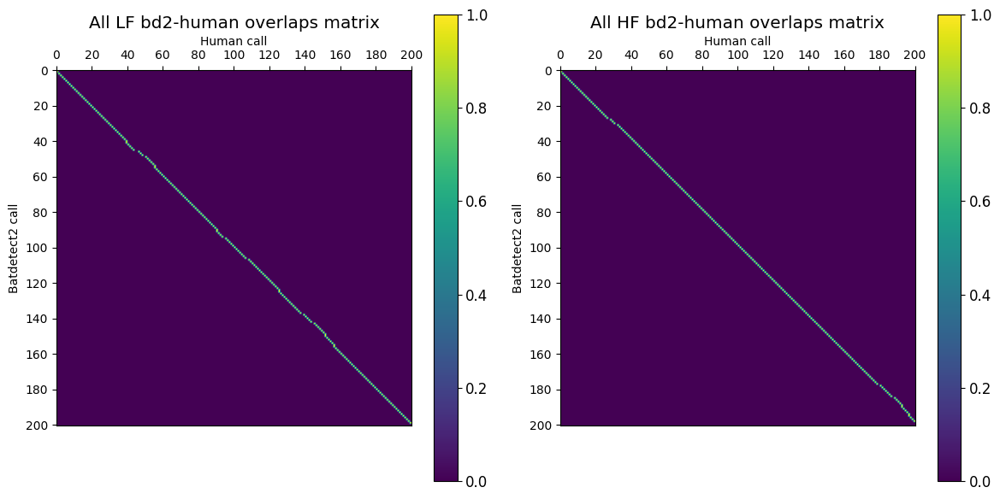

In [18]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,6))
plt.rcParams.update({'font.size':12})

samples=200
ax1.set_title('All LF bd2-human overlaps matrix')
im = ax1.imshow((lf_association_matrix[np.logical_or.reduce(lf_association_matrix, axis=1),:])[:samples,:samples])
ax1.set_xlabel('Human call')
ax1.xaxis.set_label_position('top')
ax1.set_ylabel('Batdetect2 call')
ax1.tick_params(top=True, labeltop=True, bottom=False, labelbottom=False)
fig.colorbar(im, orientation='vertical')
ax1.set_xticks(np.linspace(0, samples, 11)-0.75,
              np.linspace(0, samples, 11).astype(int))
ax1.set_yticks(np.linspace(0, samples, 11)-0.925,
              np.linspace(0, samples, 11).astype(int))



samples=200
ax2.set_title('All HF bd2-human overlaps matrix')
im = ax2.imshow((hf_association_matrix[np.logical_or.reduce(hf_association_matrix, axis=1),:])[:samples,:samples])
ax2.set_xlabel('Human call')
ax2.xaxis.set_label_position('top')
ax2.set_ylabel('Batdetect2 call')
ax2.tick_params(top=True, labeltop=True, bottom=False, labelbottom=False)
fig.colorbar(im, orientation='vertical')
ax2.set_xticks(np.linspace(0, samples, 11)-0.75,
              np.linspace(0, samples, 11).astype(int))
ax2.set_yticks(np.linspace(0, samples, 11)-0.925,
              np.linspace(0, samples, 11).astype(int))

plt.tight_layout()
plt.show()

In [19]:
hf_human_true_positives = lf_separated_performance_dfs['human_true_positives']
lf_bd2_false_negatives = lf_separated_performance_dfs['machine_false_negatives']
lf_bd2_true_positives = lf_separated_performance_dfs['machine_true_positives']
lf_bd2_false_positives = lf_separated_performance_dfs['machine_false_positives']
print(len(hf_human_true_positives), len(lf_bd2_false_negatives), len(lf_bd2_true_positives), len(lf_bd2_false_positives))

695 20 705 29215


In [20]:
hf_human_true_positives = hf_separated_performance_dfs['human_true_positives']
hf_bd2_false_negatives = hf_separated_performance_dfs['machine_false_negatives']
hf_bd2_true_positives = hf_separated_performance_dfs['machine_true_positives']
hf_bd2_false_positives = hf_separated_performance_dfs['machine_false_positives']
print(len(hf_human_true_positives), len(hf_bd2_false_negatives), len(hf_bd2_true_positives), len(hf_bd2_false_positives))

2404 18 2422 20483


In [21]:
num_trues_each_row = lf_association_matrix.sum(axis=1)
bd2_dets_with_overlap_human_dets = lf_bd2_file_all_dets.iloc[np.where(num_trues_each_row>1)[0]]
print(bd2_dets_with_overlap_human_dets.index.values)
lf_bd2_human_df_file[lf_association_matrix[3209,:]]

[]


,start_time,end_time,low_freq,high_freq,delta_time_s,snr_nist_quick_dB,Annotation,detection_confidence,input_file,freq_group,adityas_method_snr_dB,peak_frequency_time


In [22]:
num_trues_each_col = lf_association_matrix.sum(axis=0)
human_dets_with_overlap_bd2_dets = lf_bd2_human_df_file.iloc[np.where(num_trues_each_col>1)[0]]
print(human_dets_with_overlap_bd2_dets.index.values)
lf_bd2_file_all_dets[lf_association_matrix[:,39]]

[ 39  55  90 125 151 156 340 380 422 625]


,freq_group,peak_frequency_time_SPECTROGRAM,peak_frequency_SPECTROGRAM,peak_frequency_WELCH,SNR,start_time,end_time,low_freq,high_freq,class,class_prob,det_prob,individual,event,sampling_rate,input_file
2661,LF,158.045971,24000.0,25920.0,10.394970,158.0365,158.0583,24609,28860,Nyctalus leisleri,0.194,0.344,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
2662,LF,158.065721,24000.0,24960.0,-4.721174,158.0645,158.0753,22890,27786,Nyctalus leisleri,0.011,0.024,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...


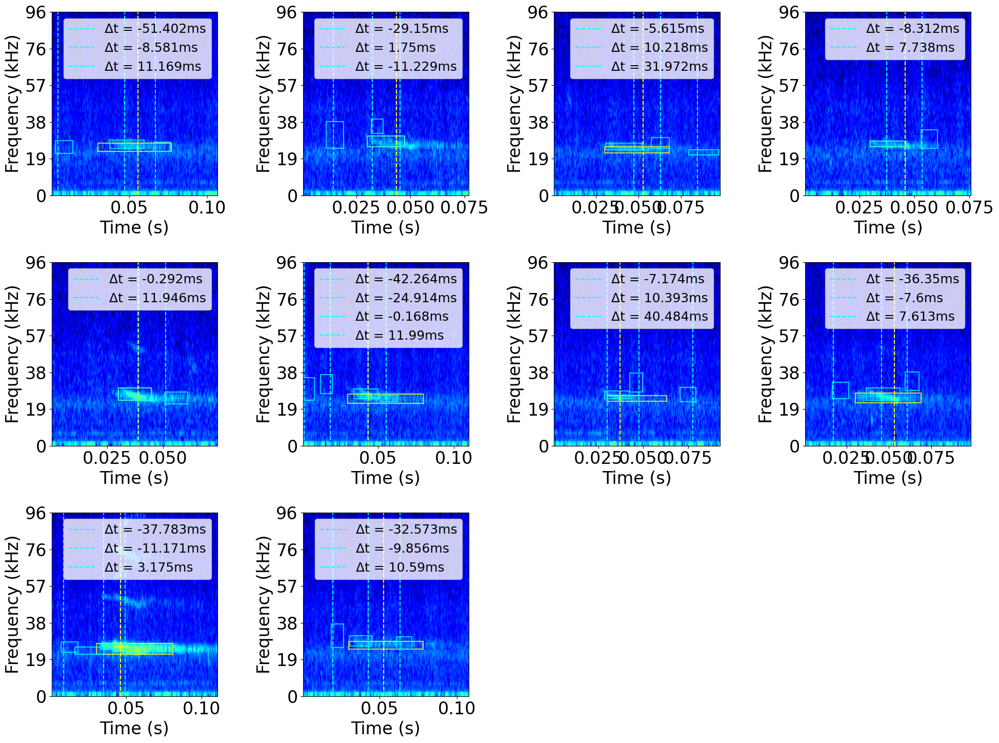

In [23]:
plt.figure(figsize=(20, 15))
plt.rcParams.update({'font.size': 24})
for i, sel_ind in enumerate((human_dets_with_overlap_bd2_dets.index).values):
    plt.subplot(3,4,i+1)
    selection_row = lf_bd2_human_df_file.iloc[sel_ind]
    file_name = f'{wav_filename}.WAV'
    file_path = Path(RAVENTXT_HUMAN_ANNOTATIONS_SAVE_DIR) / file_name
    audio_file = sf.SoundFile(file_path)
    fs = audio_file.samplerate

    start = selection_row['start_time']-0.03
    audio_file.seek(int(fs*(start)))
    duration = (selection_row['end_time']-selection_row['start_time'])+0.06
    audio_seg = audio_file.read(int(fs*duration))

    plt.specgram(audio_seg, NFFT=156, Fs=fs, cmap='jet', vmin=-120, vmax=0)

    ax = plt.gca()
    rect = patches.Rectangle(((selection_row['start_time'] - start), selection_row['low_freq']), 
                    (selection_row['end_time'] - selection_row['start_time']), (selection_row['high_freq'] - selection_row['low_freq']), 
                    linewidth=1.5, edgecolor='yellow', facecolor='none', alpha=0.8)
    ax.add_patch(rect)
    ax.axvline(x=selection_row['peak_frequency_time']-start, linestyle='dashed', color='yellow')

    plot_bd2dets = lf_bd2_file_all_dets[(lf_bd2_file_all_dets['start_time']>=start)&(lf_bd2_file_all_dets['end_time']<=(start+duration))]
    for i, row in plot_bd2dets.iterrows():
        rect = patches.Rectangle(((row['start_time'] - start), row['low_freq']), 
                        (row['end_time'] - row['start_time']), (row['high_freq'] - row['low_freq']), 
                        linewidth=1.5, edgecolor=FREQ_COLORS[selection_row['freq_group']], facecolor='none', alpha=0.8)
        ax.add_patch(rect)
        ax.axvline(x=row['peak_frequency_time_SPECTROGRAM']-start, linestyle='dashed', color='cyan', 
                label=f"Δt = {round(1000*(row['peak_frequency_time_SPECTROGRAM'] - selection_row['peak_frequency_time']), 3)}ms")

    plt.yticks(ticks=np.linspace(0, fs/2, 6), labels=np.linspace(0, fs/2000, 6).astype('int'))
    plt.legend(fontsize=18)
    plt.ylabel("Frequency (kHz)")
    plt.xlabel("Time (s)")

plt.tight_layout()
plt.show()

Above the detections within the `TP_CLASSIFICATION_THRESHOLD` are part of the true positives. They are within `TP_CLASSIFICATION_THRESHOLD` of the human annotation but NOT within `OVERLAP_TIME_THRESHOLD` of each other (which is why neither of them were dropped)

In [24]:
num_trues_each_row = hf_association_matrix.sum(axis=1)
bd2_dets_with_overlap_human_dets = hf_bd2_file_all_dets.iloc[np.where(num_trues_each_row>1)[0]]
print(bd2_dets_with_overlap_human_dets.index.values)
hf_bd2_human_df_file[hf_association_matrix[3210,:]]

[ 3210 17990 18618 21354]


,start_time,end_time,low_freq,high_freq,delta_time_s,snr_nist_quick_dB,Annotation,detection_confidence,input_file,freq_group,adityas_method_snr_dB,peak_frequency_time
378,246.849189,246.857813,45295.775,57775.076,0.0086,13.30,v,NaN,NaN,HF,6.877655,246.853898
379,246.858984,246.865694,37521.127,47323.944,0.0067,18.41,v,NaN,NaN,HF,5.973619,246.860941


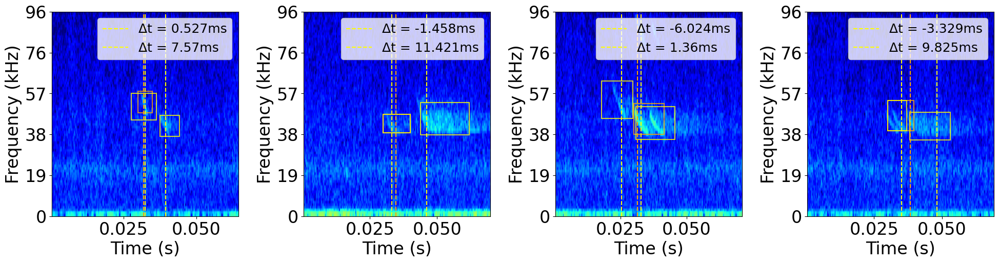

In [25]:
plt.figure(figsize=(20, 10))
plt.rcParams.update({'font.size': 24})
for i, sel_ind in enumerate((bd2_dets_with_overlap_human_dets.index).values):
    plt.subplot(2,4,i+1)
    selection_row = hf_bd2_file_all_dets.iloc[sel_ind]
    input_file = Path(selection_row['input_file'])
    file_name = input_file.name
    file_path = Path(RAVENTXT_HUMAN_ANNOTATIONS_SAVE_DIR) / file_name
    audio_file = sf.SoundFile(file_path)
    fs = audio_file.samplerate

    start = selection_row['start_time']-0.03
    audio_file.seek(int(fs*(start)))
    duration = (selection_row['end_time']-selection_row['start_time'])+0.06
    audio_seg = audio_file.read(int(fs*duration))

    plt.specgram(audio_seg, NFFT=156, Fs=fs, cmap='jet', vmin=-120, vmax=0)

    ax = plt.gca()
    rect = patches.Rectangle(((selection_row['start_time'] - start), selection_row['low_freq']), 
                    (selection_row['end_time'] - selection_row['start_time']), (selection_row['high_freq'] - selection_row['low_freq']), 
                    linewidth=1.5, edgecolor=FREQ_COLORS[selection_row['freq_group']], facecolor='none', alpha=0.8)
    ax.add_patch(rect)
    ax.axvline(x=selection_row['peak_frequency_time_SPECTROGRAM']-start, linestyle='dashed', color=FREQ_COLORS[selection_row['freq_group']])

    plot_humandets = hf_bd2_human_df_file[(hf_bd2_human_df_file['start_time']>=start)&(hf_bd2_human_df_file['end_time']<=(start+duration))]
    for i, row in plot_humandets.iterrows():
        rect = patches.Rectangle(((row['start_time'] - start), row['low_freq']), 
                        (row['end_time'] - row['start_time']), (row['high_freq'] - row['low_freq']), 
                        linewidth=1.5, edgecolor='yellow', facecolor='none', alpha=0.8)
        ax.add_patch(rect)
        ax.axvline(x=row['peak_frequency_time']-start, linestyle='dashed', color='yellow', 
                label=f"Δt = {round(1000*(row['peak_frequency_time'] - selection_row['peak_frequency_time_SPECTROGRAM']), 3)}ms")

    plt.yticks(ticks=np.linspace(0, fs/2, 6), labels=np.linspace(0, fs/2000, 6).astype('int'))
    plt.legend(fontsize=18)
    plt.ylabel("Frequency (kHz)")
    plt.xlabel("Time (s)")

plt.tight_layout()
plt.show()

Above the human annotations within the `TP_CLASSIFICATION_THRESHOLD` are counted as overlapping with bd2 detections. This does NOT influence the bd2 true positives set because these are seen as only "human" true positives whereas we look at true values going rightward for bd2 true positives.

In [26]:
num_trues_each_col = hf_association_matrix.sum(axis=0)
human_dets_with_overlap_bd2_dets = hf_bd2_human_df_file.iloc[np.where(num_trues_each_col>1)[0]]
print(human_dets_with_overlap_bd2_dets.index.values)
hf_bd2_file_all_dets[hf_association_matrix[:,1105]]

[ 192  196  222  602  668  769  778  792 1105 1114 1525 1574 1622 1664
 1810 1827 1933 2041 2057 2060 2214 2235]


,freq_group,peak_frequency_time_SPECTROGRAM,peak_frequency_SPECTROGRAM,peak_frequency_WELCH,SNR,start_time,end_time,low_freq,high_freq,class,class_prob,det_prob,individual,event,sampling_rate,input_file
14068,HF,1146.302833,78000.0,74880.0,0.277254,1146.2925,1146.3340,68437,82925,Rhinolophus ferrumequinum,0.025,0.025,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
14069,HF,1146.315454,42000.0,44160.0,6.506388,1146.3105,1146.3199,41796,49026,Pipistrellus nathusii,0.420,0.469,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...


In [27]:
hf_bd2_human_df_file.loc[1105:1105]

,start_time,end_time,low_freq,high_freq,delta_time_s,snr_nist_quick_dB,Annotation,detection_confidence,input_file,freq_group,adityas_method_snr_dB,peak_frequency_time
1105,1146.30904,1146.321062,39258.414,50657.079,0.012,13.99,v,NaN,NaN,HF,5.679385,1146.31385


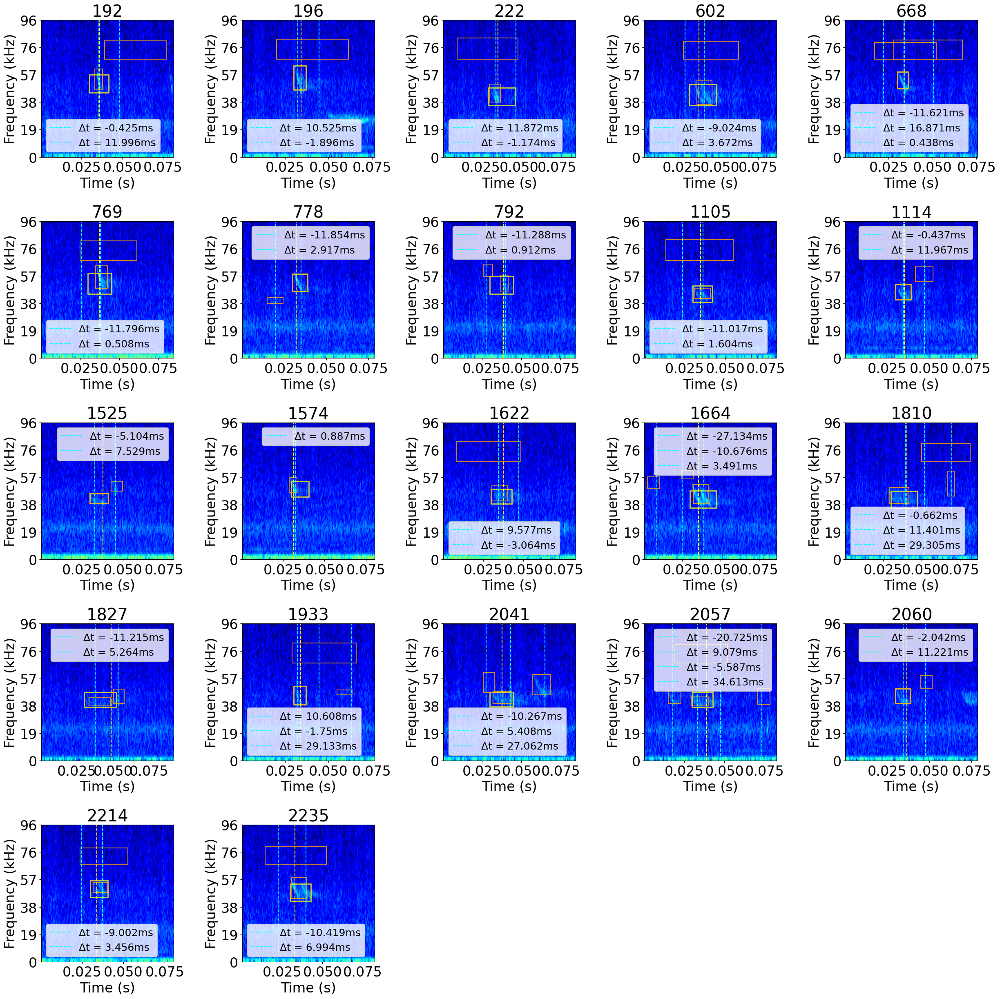

In [28]:
plt.figure(figsize=(25, 25))
plt.rcParams.update({'font.size': 24})
for i, sel_ind in enumerate((human_dets_with_overlap_bd2_dets.index).values):
    plt.subplot(5,5,i+1)
    plt.title(sel_ind)
    selection_row = hf_bd2_human_df_file.iloc[sel_ind]
    file_name = f'{wav_filename}.WAV'
    file_path = Path(RAVENTXT_HUMAN_ANNOTATIONS_SAVE_DIR) / file_name
    audio_file = sf.SoundFile(file_path)
    fs = audio_file.samplerate

    start = selection_row['start_time']-0.03
    audio_file.seek(int(fs*(start)))
    duration = (selection_row['end_time']-selection_row['start_time'])+0.07
    audio_seg = audio_file.read(int(fs*duration))

    plt.specgram(audio_seg, NFFT=156, Fs=fs, cmap='jet', vmin=-120, vmax=0)

    ax = plt.gca()
    rect = patches.Rectangle(((selection_row['start_time'] - start), selection_row['low_freq']), 
                    (selection_row['end_time'] - selection_row['start_time']), (selection_row['high_freq'] - selection_row['low_freq']), 
                    linewidth=2, edgecolor='yellow', facecolor='none', alpha=0.8)
    ax.add_patch(rect)
    ax.axvline(x=selection_row['peak_frequency_time']-start, linestyle='dashed', color='yellow')

    plot_bd2dets = hf_bd2_file_all_dets[(hf_bd2_file_all_dets['start_time']>=start)&(hf_bd2_file_all_dets['end_time']<=(start+duration))]
    for i, row in plot_bd2dets.iterrows():
        rect = patches.Rectangle(((row['start_time'] - start), row['low_freq']), 
                        (row['end_time'] - row['start_time']), (row['high_freq'] - row['low_freq']), 
                        linewidth=1.5, edgecolor=FREQ_COLORS[selection_row['freq_group']], facecolor='none', alpha=0.8)
        ax.add_patch(rect)
        ax.axvline(x=row['peak_frequency_time_SPECTROGRAM']-start, linestyle='dashed', color='cyan', 
                label=f"Δt = {round(1000*(row['peak_frequency_time_SPECTROGRAM'] - selection_row['peak_frequency_time']), 3)}ms")

    plt.yticks(ticks=np.linspace(0, fs/2, 6), labels=np.linspace(0, fs/2000, 6).astype('int'))
    plt.legend(fontsize=18)
    plt.ylabel("Frequency (kHz)")
    plt.xlabel("Time (s)")

plt.tight_layout()
plt.show()

Above the detections within the `TP_CLASSIFICATION_THRESHOLD` are part of the true positives. They are within `TP_CLASSIFICATION_THRESHOLD` of the human annotation but NOT within `OVERLAP_TIME_THRESHOLD` of each other (which is why neither of them were dropped)

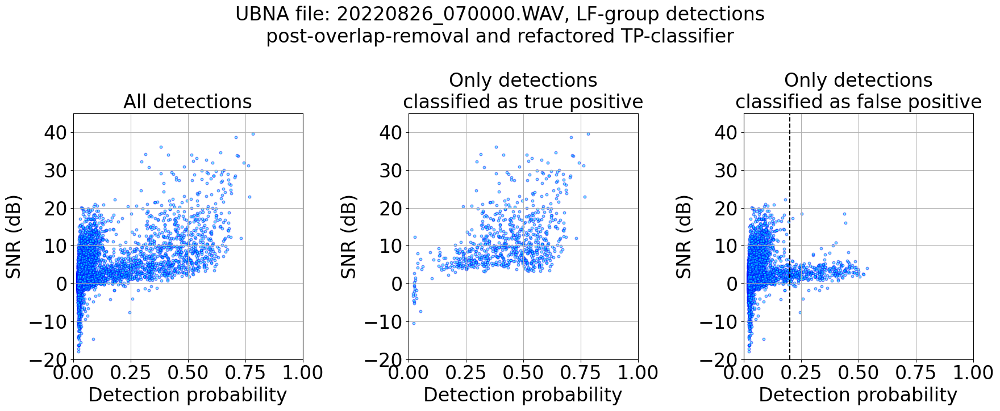

In [29]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18,7.5))
plt.rcParams.update({'font.size':20})

fig.suptitle(f'UBNA file: {wav_filename}.WAV, LF-group detections\npost-overlap-removal and refactored TP-classifier')

ax = ax1
ax.set_title(f'All detections')
ax.scatter(lf_bd2_file_all_dets['det_prob'].values, lf_bd2_file_all_dets['SNR'].values,
            alpha=0.5, s=10, facecolor='cyan', edgecolor='blue')
ax.grid(which='both')
ax.set_xlabel('Detection probability')
ax.set_ylabel('SNR (dB)')
ax.set_xlim(0, 1.0)
ax.set_ylim(-20, 45.0)

ax = ax2
ax.set_title(f'Only detections\nclassified as true positive')
ax.scatter(lf_bd2_true_positives['det_prob'].values, lf_bd2_true_positives['SNR'].values,
            alpha=0.5, s=10, facecolor='cyan', edgecolor='blue')
ax.grid(which='both')
ax.set_xlabel('Detection probability')
ax.set_ylabel('SNR (dB)')
ax.set_xlim(0, 1.0)
ax.set_ylim(-20, 45.0)

ax = ax3
ax.set_title(f'Only detections\nclassified as false positive')
ax.scatter(lf_bd2_false_positives['det_prob'].values, lf_bd2_false_positives['SNR'].values,
            alpha=0.5, s=10, facecolor='cyan', edgecolor='blue')
ax.axvline(x=0.2, linestyle='dashed', color='k')
ax.grid(which='both')
ax.set_xlabel('Detection probability')
ax.set_ylabel('SNR (dB)')
ax.set_xlim(0, 1.0)
ax.set_ylim(-20, 45.0)


fig.tight_layout()
plt.show()

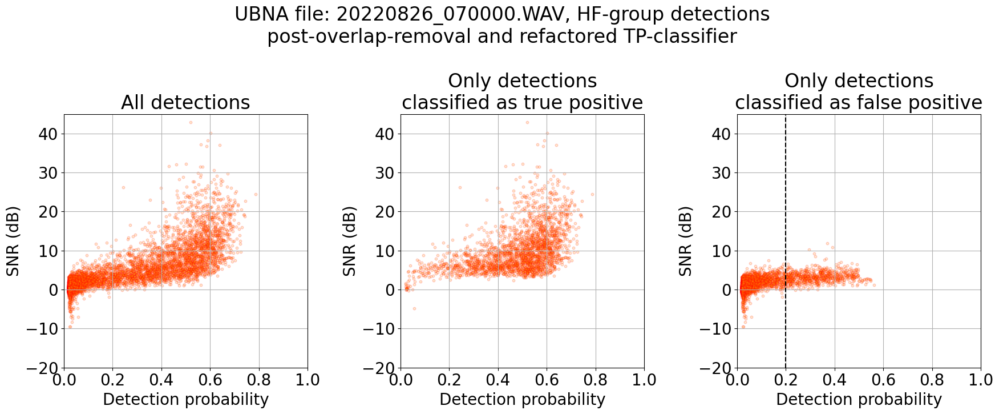

In [30]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18,7.5))
plt.rcParams.update({'font.size':20})

fig.suptitle(f'UBNA file: {wav_filename}.WAV, HF-group detections\npost-overlap-removal and refactored TP-classifier')

ax = ax1
ax.set_title(f'All detections')
ax.scatter(hf_bd2_file_all_dets['det_prob'].values, hf_bd2_file_all_dets['SNR'].values,
            alpha=0.2, s=10, facecolor='orange', edgecolor='red')
ax.grid(which='both')
ax.set_xlabel('Detection probability')
ax.set_ylabel('SNR (dB)')
ax.set_xlim(0, 1.0)
ax.set_ylim(-20, 45.0)

ax = ax2
ax.set_title(f'Only detections\nclassified as true positive')
ax.scatter(hf_bd2_true_positives['det_prob'].values, hf_bd2_true_positives['SNR'].values,
            alpha=0.2, s=10, facecolor='orange', edgecolor='red')
ax.grid(which='both')
ax.set_xlabel('Detection probability')
ax.set_ylabel('SNR (dB)')
ax.set_xlim(0, 1.0)
ax.set_ylim(-20, 45.0)

ax = ax3
ax.set_title(f'Only detections\nclassified as false positive')
ax.scatter(hf_bd2_false_positives['det_prob'].values, hf_bd2_false_positives['SNR'].values,
            alpha=0.2, s=10, facecolor='orange', edgecolor='red')
ax.axvline(x=0.2, linestyle='dashed', color='k')
ax.grid(which='both')
ax.set_xlabel('Detection probability')
ax.set_ylabel('SNR (dB)')
ax.set_xlim(0, 1.0)
ax.set_ylim(-20, 45.0)


fig.tight_layout()
plt.show()

In [31]:
suspect_lf_bd2_false_positives = lf_bd2_false_positives[(lf_bd2_false_positives['det_prob']>0.2)]
suspect_lf_bd2_false_positives

,freq_group,peak_frequency_time_SPECTROGRAM,peak_frequency_SPECTROGRAM,peak_frequency_WELCH,SNR,start_time,end_time,low_freq,high_freq,class,class_prob,det_prob,individual,event,sampling_rate,input_file
533,LF,31.196237,24000.0,24000.0,1.052236,31.1865,31.2022,23750,29512,Nyctalus leisleri,0.138,0.322,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
544,LF,31.770783,24000.0,24960.0,1.232003,31.7585,31.7753,24609,29107,Nyctalus leisleri,0.103,0.242,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
563,LF,33.094317,24000.0,25920.0,3.818196,33.0855,33.1011,24609,28287,Nyctalus leisleri,0.215,0.370,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
569,LF,33.504879,24000.0,25920.0,4.136854,33.4915,33.5056,24609,28405,Nyctalus leisleri,0.234,0.416,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
573,LF,33.788467,24000.0,24960.0,4.613169,33.7805,33.7987,24609,28572,Nyctalus leisleri,0.118,0.226,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20929,LF,1192.989246,24000.0,24960.0,3.116921,1192.9835,1193.0029,24609,28014,Nyctalus leisleri,0.178,0.260,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
20933,LF,1193.253875,24000.0,24960.0,3.586618,1193.2485,1193.2620,25468,29386,Nyctalus leisleri,0.104,0.228,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
23255,LF,1339.881608,18000.0,20160.0,18.394509,1339.8795,1339.8846,16875,33444,Plecotus austriacus,0.154,0.254,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
25159,LF,1462.556333,24000.0,25920.0,5.359916,1462.5435,1462.5580,25468,30697,Nyctalus leisleri,0.176,0.285,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...


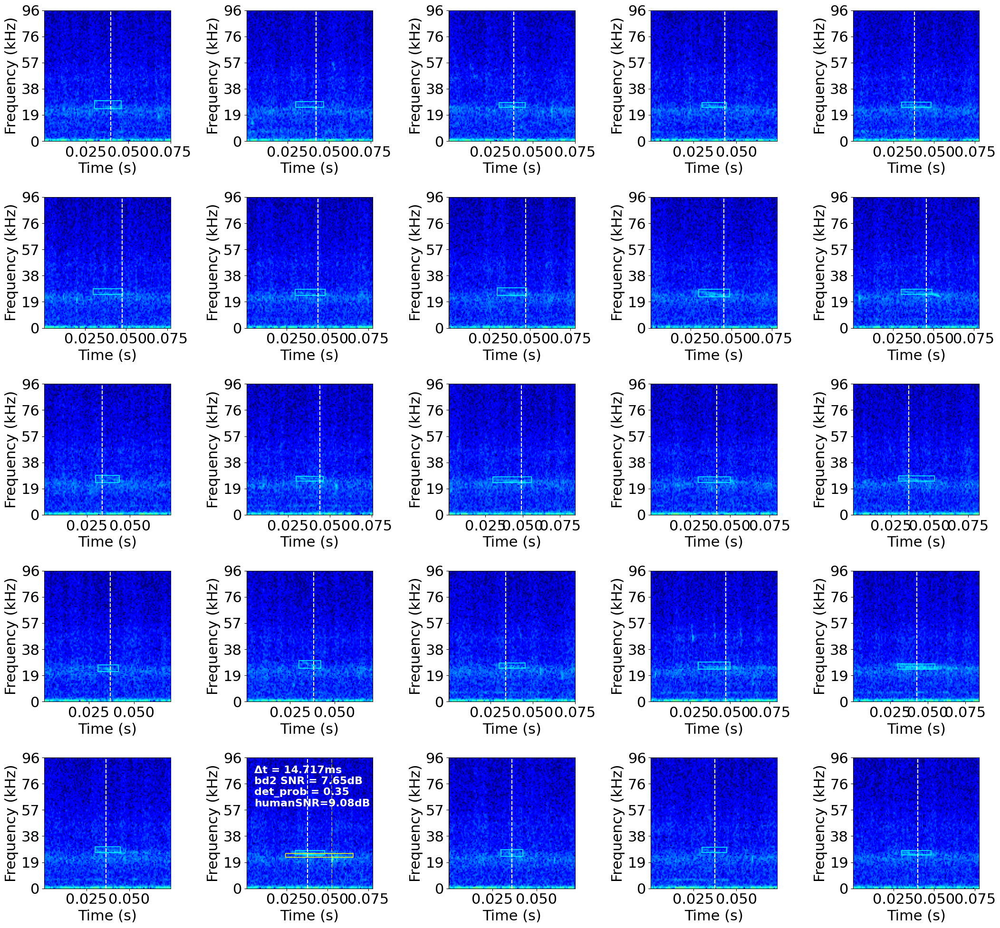

In [34]:
selections = suspect_lf_bd2_false_positives[:25].reset_index(drop=True).copy()
bd2_human_df_file = snr_included_ravenpro_human_txt.copy()
bd2_human_df_file = bd2_human_df_file.drop(columns=['Selection', 'View', 'Channel'])
bd2_human_df_file.rename(columns={'Begin Time (s)':'start_time',
                            'End Time (s)':'end_time',
                            'Low Freq (Hz)':'low_freq',
                            'High Freq (Hz)':'high_freq',
                            'Delta Time (s)':'delta_time_s',
                            'Manually-Verified Phonic Group':'freq_group',
                            'SNR NIST Quick (dB)':'snr_nist_quick_dB'}, inplace=True)
bd2_human_df_file.sort_values('start_time', inplace=True)
bd2_human_df_file = bd2_human_df_file[bd2_human_df_file['adityas_method_snr_dB']>=3]
lf_bd2_human_df_file = bd2_human_df_file[bd2_human_df_file['freq_group']=='LF'].reset_index(drop=True).copy()

plt.figure(figsize=(4.3*int(np.ceil(len(selections)**0.5)), 4*int(np.ceil(len(selections)**0.5))))
plt.rcParams.update({'font.size': 22})
overlap_count = 0
for ind, selection_row in selections.iterrows():
    plt.subplot(int(np.ceil(len(selections)**0.5)), int(np.ceil(len(selections)**0.5)), ind+1)
    input_file = Path(selection_row['input_file'])
    file_name = input_file.name
    file_path = Path(RAVENTXT_HUMAN_ANNOTATIONS_SAVE_DIR) / file_name
    audio_file = sf.SoundFile(file_path)
    fs = audio_file.samplerate

    raventxt_human_filename = f'{input_file.stem}_manually_verified_by_AK_with_groups'

    start = selection_row['start_time']-0.03
    audio_file.seek(int(fs*(start)))
    duration = (selection_row['end_time']-selection_row['start_time'])+0.06
    audio_seg = audio_file.read(int(fs*duration))

    plt.specgram(audio_seg, NFFT=256, Fs=fs, cmap='jet', vmin=-120, vmax=0)

    ax = plt.gca()
    rect = patches.Rectangle(((selection_row['start_time'] - start), selection_row['low_freq']), 
                    (selection_row['end_time'] - selection_row['start_time']), (selection_row['high_freq'] - selection_row['low_freq']), 
                    linewidth=1.5, edgecolor=FREQ_COLORS[selection_row['freq_group']], facecolor='none', alpha=0.8)
    ax.add_patch(rect)
    ax.axvline(x=selection_row['peak_frequency_time_SPECTROGRAM'] - start, linestyle='dashed', color='w')

    plot_humandets = lf_bd2_human_df_file[(lf_bd2_human_df_file['start_time']>=start)&(lf_bd2_human_df_file['end_time']<=(start+duration))]        
    # plt.text(x=0.005, y=70e3, s=f"bd2 SNR = {round(selection_row['SNR'], 2)}dB\ndet_prob = {round(selection_row['det_prob'], 2)}",
    #         fontsize=16, color='white', fontweight='bold', zorder=2)
    if len(plot_humandets)>0:
        closest_ind = np.abs((plot_humandets['peak_frequency_time'] - selection_row['peak_frequency_time_SPECTROGRAM'])).argmin()
        human_det = plot_humandets.iloc[closest_ind]
        rect = patches.Rectangle(((human_det['start_time'] - start), human_det['low_freq']), 
                        (human_det['end_time'] - human_det['start_time']), (human_det['high_freq'] - human_det['low_freq']), 
                        linewidth=1.5, edgecolor='yellow', facecolor='none', alpha=0.8, label=f'{human_det["adityas_method_snr_dB"]:.3}dB')
        ax.add_patch(rect)
        shortest_t_distance_in_window = (1000*(human_det['peak_frequency_time'] - selection_row['peak_frequency_time_SPECTROGRAM']))
        plt.text(x=0.005, y=60e3, s=f"Δt = {round(shortest_t_distance_in_window, 3)}ms\nbd2 SNR = {round(selection_row['SNR'], 2)}dB\ndet_prob = {round(selection_row['det_prob'], 2)}\nhumanSNR={round(human_det['adityas_method_snr_dB'], 2)}dB",
                fontsize=16, color='white', fontweight='bold', zorder=2)
        ax.axvline(x=human_det['peak_frequency_time']-start, linestyle='dashed', color='yellow', alpha=0.5)

    plt.yticks(ticks=np.linspace(0, fs/2, 6), labels=np.linspace(0, fs/2000, 6).astype('int'))
    plt.ylabel("Frequency (kHz)")
    plt.xlabel("Time (s)")

plt.tight_layout()
plt.show()

In [35]:
selections = suspect_lf_bd2_false_positives.reset_index(drop=True).copy()
overlap_count = 0
overlap_determination_thresh = 32
for ind, selection_row in selections.iterrows():
    raventxt_human_filename = f'{input_file.stem}_manually_verified_by_AK_with_groups'

    start = selection_row['start_time']-0.03
    duration = (selection_row['end_time']-selection_row['start_time'])+0.09
    plot_humandets = lf_bd2_human_df_file[(lf_bd2_human_df_file['start_time']>=start)&(lf_bd2_human_df_file['end_time']<=(start+duration))]
    shortest_t_delay_in_window = np.abs(1000*(plot_humandets['peak_frequency_time'] - selection_row['peak_frequency_time_SPECTROGRAM'])).min()
    shortest_t_distance_in_window = (1000*(plot_humandets['peak_frequency_time'] - selection_row['peak_frequency_time_SPECTROGRAM'])).min()
    if (np.abs(shortest_t_distance_in_window)<overlap_determination_thresh):
        overlap_count+=1
print(f'{overlap_count}/{len(selections)} ({round(overlap_count/len(selections), 3)}) LF false positives were actually true positives with peak times distances > {int(1000*TP_CLASSIFICATION_THRESHOLD)}ms but < {overlap_determination_thresh}ms')

14/285 (0.049) LF false positives were actually true positives with peak times distances > 12ms but < 32ms


In [36]:
suspect_hf_bd2_false_positives = hf_bd2_false_positives[hf_bd2_false_positives['det_prob']>0.2]
suspect_hf_bd2_false_positives

,freq_group,peak_frequency_time_SPECTROGRAM,peak_frequency_SPECTROGRAM,peak_frequency_WELCH,SNR,start_time,end_time,low_freq,high_freq,class,class_prob,det_prob,individual,event,sampling_rate,input_file
14,HF,1.732025,48000.0,47040.0,3.570422,1.7295,1.7371,46953,51351,Pipistrellus pipistrellus,0.388,0.428,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
48,HF,4.166333,48000.0,48000.0,3.463646,4.1625,4.1685,45234,59329,Pipistrellus pipistrellus,0.218,0.312,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
117,HF,8.578258,42000.0,41280.0,4.962143,8.5735,8.5812,39218,47453,Pipistrellus nathusii,0.393,0.470,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
119,HF,8.681750,42000.0,40320.0,1.788974,8.6785,8.6880,38359,43377,Pipistrellus nathusii,0.203,0.227,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
120,HF,8.779083,42000.0,40320.0,2.540203,8.7755,8.7835,38359,44413,Pipistrellus nathusii,0.211,0.283,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22708,HF,1775.679838,48000.0,43200.0,2.227914,1775.6775,1775.6866,41796,46096,Pipistrellus nathusii,0.198,0.227,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
22749,HF,1778.224233,42000.0,43200.0,1.928925,1778.2205,1778.2301,39218,43998,Pipistrellus nathusii,0.220,0.273,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
22820,HF,1787.050338,42000.0,42240.0,1.932710,1787.0415,1787.0511,38359,43962,Pipistrellus nathusii,0.369,0.398,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
22825,HF,1787.485042,42000.0,44160.0,1.970963,1787.4815,1787.4910,38359,44446,Pipistrellus nathusii,0.441,0.462,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...


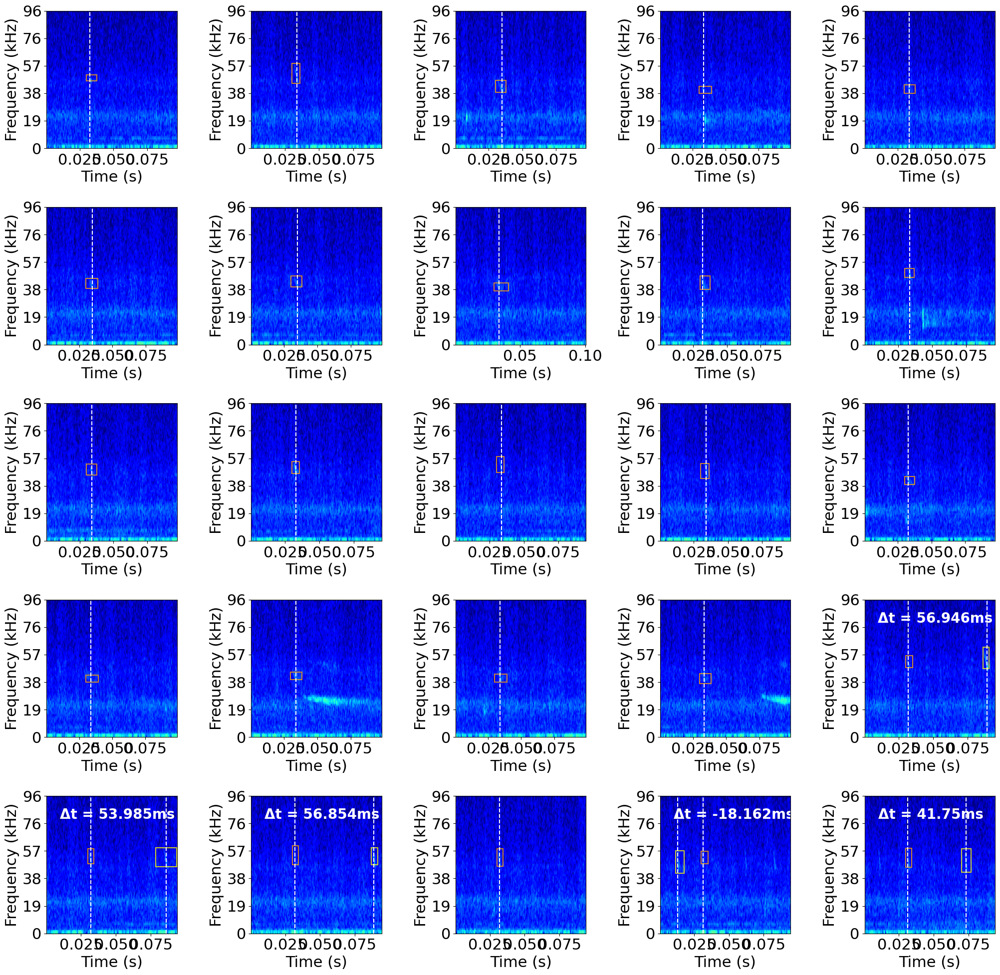

In [37]:
selections = suspect_hf_bd2_false_positives[:25].reset_index(drop=True).copy()
plt.figure(figsize=(4.1*int(np.ceil(len(selections)**0.5)), 4*int(np.ceil(len(selections)**0.5))))
plt.rcParams.update({'font.size': 22})
overlap_count = 0
for ind, selection_row in selections.iterrows():
    plt.subplot(int(np.ceil(len(selections)**0.5)), int(np.ceil(len(selections)**0.5)), ind+1)
    input_file = Path(selection_row['input_file'])
    file_name = input_file.name
    file_path = Path(RAVENTXT_HUMAN_ANNOTATIONS_SAVE_DIR) / file_name
    audio_file = sf.SoundFile(file_path)
    fs = audio_file.samplerate

    file_selections = selections[selections['input_file']==str(input_file)]
    raventxt_human_filename = f'{input_file.stem}_manually_verified_by_AK_with_groups'

    start = selection_row['start_time']-0.03
    audio_file.seek(int(fs*(start)))
    duration = (selection_row['end_time']-selection_row['start_time'])+0.09
    audio_seg = audio_file.read(int(fs*duration))

    plt.specgram(audio_seg, NFFT=156, Fs=fs, cmap='jet', vmin=-120, vmax=0)

    ax = plt.gca()
    rect = patches.Rectangle(((selection_row['start_time'] - start), selection_row['low_freq']), 
                    (selection_row['end_time'] - selection_row['start_time']), (selection_row['high_freq'] - selection_row['low_freq']), 
                    linewidth=1.5, edgecolor=FREQ_COLORS[selection_row['freq_group']], facecolor='none', alpha=0.8)
    ax.add_patch(rect)
    ax.axvline(x=selection_row['peak_frequency_time_SPECTROGRAM']-start, linestyle='dashed', color='w')

    plot_humandets = hf_bd2_human_df_file[(hf_bd2_human_df_file['start_time']>=start)&(hf_bd2_human_df_file['end_time']<=(start+duration))]
    for i, row in plot_humandets.iterrows():
        rect = patches.Rectangle(((row['start_time'] - start), row['low_freq']), 
                        (row['end_time'] - row['start_time']), (row['high_freq'] - row['low_freq']), 
                        linewidth=1.5, edgecolor='yellow', facecolor='none', alpha=0.8)
        ax.add_patch(rect)
        ax.axvline(x=row['peak_frequency_time']-start, linestyle='dashed', color='w')
    shortest_t_delay_in_window = np.abs(1000*(plot_humandets['peak_frequency_time'] - selection_row['peak_frequency_time_SPECTROGRAM'])).min()
    shortest_t_distance_in_window = (1000*(plot_humandets['peak_frequency_time'] - selection_row['peak_frequency_time_SPECTROGRAM'])).min()
    if ~(np.isnan(shortest_t_delay_in_window)):
        plt.text(x=0.01, y=80e3, s=f"Δt = {round(shortest_t_distance_in_window, 3)}ms",
                fontsize=20, color='white', fontweight='bold', zorder=2)
    if (np.abs(shortest_t_distance_in_window)<10):
        overlap_count+=1
        plt.text(x=0, y=50e3, s=f'{overlap_count}', color='w', fontweight='bold')
    plt.yticks(ticks=np.linspace(0, fs/2, 6), labels=np.linspace(0, fs/2000, 6).astype('int'))
    plt.ylabel("Frequency (kHz)")
    plt.xlabel("Time (s)")

plt.tight_layout()
plt.show()

In [38]:
selections = suspect_hf_bd2_false_positives.reset_index(drop=True).copy()
overlap_count = 0
overlap_determination_thresh = 20
for ind, selection_row in selections.iterrows():
    raventxt_human_filename = f'{input_file.stem}_manually_verified_by_AK_with_groups'

    start = selection_row['start_time']-0.03
    duration = (selection_row['end_time']-selection_row['start_time'])+0.09
    plot_humandets = hf_bd2_human_df_file[(hf_bd2_human_df_file['start_time']>=start)&(hf_bd2_human_df_file['end_time']<=(start+duration))]
    shortest_t_delay_in_window = np.abs(1000*(plot_humandets['peak_frequency_time'] - selection_row['peak_frequency_time_SPECTROGRAM'])).min()
    shortest_t_distance_in_window = (1000*(plot_humandets['peak_frequency_time'] - selection_row['peak_frequency_time_SPECTROGRAM'])).min()
    if (np.abs(shortest_t_distance_in_window)<overlap_determination_thresh):
        overlap_count+=1
print(f'{overlap_count}/{len(selections)} ({round(overlap_count/len(selections), 3)}) HF false positives were actually true positives with peak times distances > {int(1000*TP_CLASSIFICATION_THRESHOLD)}ms but < {overlap_determination_thresh}ms')

10/698 (0.014) HF false positives were actually true positives with peak times distances > 12ms but < 20ms


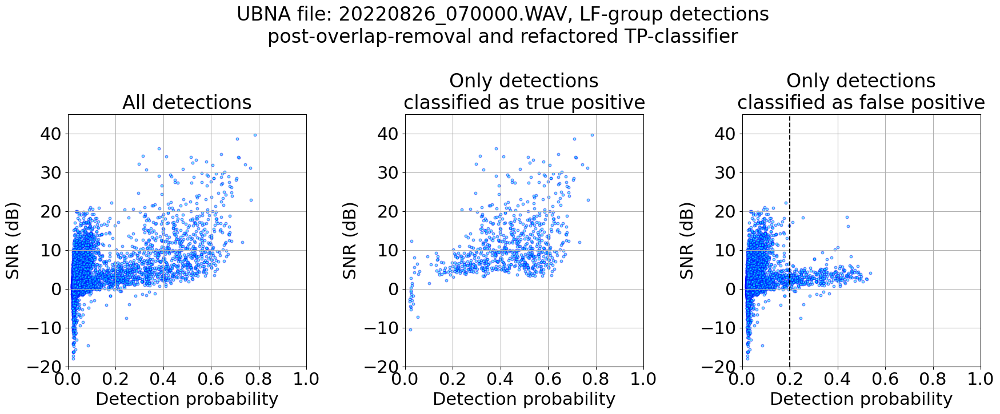

In [39]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18,7.5))
plt.rcParams.update({'font.size':20})

fig.suptitle(f'UBNA file: {wav_filename}.WAV, LF-group detections\npost-overlap-removal and refactored TP-classifier')

ax = ax1
ax.set_title(f'All detections')
ax.scatter(lf_bd2_file_all_dets['det_prob'].values, lf_bd2_file_all_dets['SNR'].values,
            alpha=0.5, s=10, facecolor='cyan', edgecolor='blue')
ax.grid(which='both')
ax.set_xlabel('Detection probability')
ax.set_ylabel('SNR (dB)')
ax.set_xlim(0, 1.0)
ax.set_ylim(-20, 45.0)

ax = ax2
ax.set_title(f'Only detections\nclassified as true positive')
ax.scatter(lf_bd2_true_positives['det_prob'].values, lf_bd2_true_positives['SNR'].values,
            alpha=0.5, s=10, facecolor='cyan', edgecolor='blue')
ax.grid(which='both')
ax.set_xlabel('Detection probability')
ax.set_ylabel('SNR (dB)')
ax.set_xlim(0, 1.0)
ax.set_ylim(-20, 45.0)

ax = ax3
ax.set_title(f'Only detections\nclassified as false positive')
ax.scatter(lf_bd2_false_positives['det_prob'].values, lf_bd2_false_positives['SNR'].values,
            alpha=0.5, s=10, facecolor='cyan', edgecolor='blue')
ax.axvline(x=0.2, linestyle='dashed', color='k')
ax.grid(which='both')
ax.set_xlabel('Detection probability')
ax.set_ylabel('SNR (dB)')
ax.set_xlim(0, 1.0)
ax.set_ylim(-20, 45.0)


fig.tight_layout()
plt.show()

In [40]:
suspect_lf_bd2_true_positives = lf_bd2_true_positives[(lf_bd2_true_positives['det_prob']<0.1)&(lf_bd2_true_positives['SNR']<10)]
suspect_lf_bd2_true_positives

,freq_group,peak_frequency_time_SPECTROGRAM,peak_frequency_SPECTROGRAM,peak_frequency_WELCH,SNR,start_time,end_time,low_freq,high_freq,class,class_prob,det_prob,individual,event,sampling_rate,input_file
2662,LF,158.065721,24000.0,24960.0,-4.721174,158.0645,158.0753,22890,27786,Nyctalus leisleri,0.011,0.024,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
2790,LF,166.540804,36000.0,34560.0,2.719624,166.5405,166.5458,32343,40037,Myotis daubentonii,0.010,0.025,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
3023,LF,177.772167,24000.0,22080.0,8.278833,177.7705,177.7775,17734,29665,Plecotus austriacus,0.075,0.094,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
3347,LF,197.751913,24000.0,24000.0,-2.624741,197.7465,197.7569,24609,30332,Nyctalus leisleri,0.009,0.021,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
4836,LF,290.226038,24000.0,25920.0,-5.262796,290.2255,290.2329,24609,34240,Plecotus austriacus,0.011,0.025,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
5114,LF,305.051579,24000.0,24960.0,-10.458530,305.0515,305.0614,22031,28047,Plecotus austriacus,0.008,0.022,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
5138,LF,306.135812,24000.0,24960.0,-2.959191,306.1315,306.1430,22890,26330,Nyctalus leisleri,0.018,0.029,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
5267,LF,312.002233,24000.0,24000.0,-3.928384,312.0015,312.0106,24609,31405,Nyctalus leisleri,0.014,0.034,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
5380,LF,316.578346,24000.0,25920.0,3.784053,316.5685,316.5838,25468,30224,Nyctalus leisleri,0.027,0.057,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
6274,LF,366.009129,24000.0,25920.0,6.480349,366.0015,366.0126,22890,27809,Nyctalus leisleri,0.021,0.052,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...


In [41]:
args = dict()
args['chunk_size'] = 2
args['detection_threshold'] = 0.00

ones = int(args['detection_threshold'])
decimals = int(int(100*(args['detection_threshold'])) % 100)
threshold_tag = f"threshold{ones}p{decimals:02}"
save_loc = Path(f"bd2__{threshold_tag}_chunksize{int(args['chunk_size'])}_{wav_filename}.csv")

filepath = BD2_DETS_SAVE_DIR / save_loc
batdetect2_df = pd.read_csv(filepath, sep=',', index_col=0)
batdetect2_df.rename(columns={'KMEANS_CLASSES':'freq_group'}, inplace=True)
selected_batdetect2_df = batdetect2_df[(batdetect2_df['start_time']>=346)&(batdetect2_df['end_time']<=347)].reset_index(drop=True)
selected_batdetect2_df

,freq_group,peak_frequency_time_SPECTROGRAM,peak_frequency_SPECTROGRAM,peak_frequency_WELCH,SNR,start_time,end_time,low_freq,high_freq,class,class_prob,det_prob,individual,event,sampling_rate,input_file
0,LF,346.012008,24000.0,22080.0,0.851943,346.0015,346.0157,20312,25345,Nyctalus noctula,0.012,0.032,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
1,HF,346.022142,78000.0,71040.0,0.434200,346.0015,346.0324,68437,80515,Rhinolophus ferrumequinum,0.042,0.043,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
2,LF,346.018425,24000.0,22080.0,0.711696,346.0085,346.0262,19453,23032,Nyctalus noctula,0.016,0.031,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
3,HF,346.022146,78000.0,72960.0,0.313846,346.0115,346.0540,68437,82432,Rhinolophus ferrumequinum,0.024,0.024,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
4,LF,346.025283,30000.0,27840.0,0.895862,346.0215,346.0293,28046,38156,Eptesicus serotinus,0.010,0.030,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,HF,346.909904,42000.0,41280.0,7.311484,346.9055,346.9137,38359,46565,Pipistrellus nathusii,0.265,0.449,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
68,LF,346.929183,24000.0,22080.0,0.755673,346.9235,346.9434,19453,23362,Nyctalus noctula,0.014,0.025,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
69,HF,346.927325,36000.0,38400.0,-2.840253,346.9255,346.9338,36640,42835,Pipistrellus nathusii,0.012,0.025,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
70,HF,346.950950,60000.0,59520.0,0.680258,346.9485,346.9553,56406,63586,Pipistrellus pygmaeus,0.025,0.026,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...


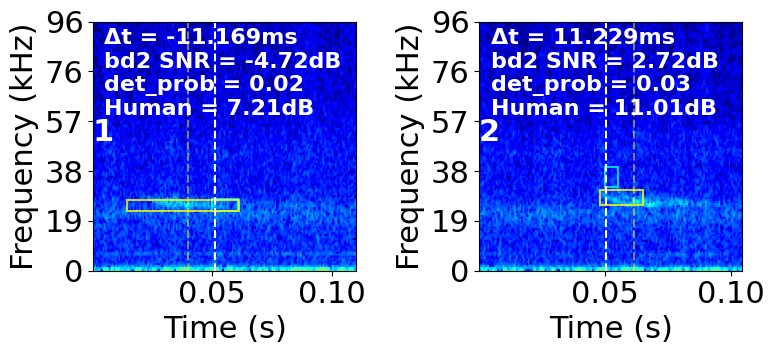

In [55]:
selections = suspect_lf_bd2_true_positives[:2].reset_index(drop=True).copy()
plt.figure(figsize=(4.1*int(np.ceil(len(selections))), 4))
plt.rcParams.update({'font.size': 22})
overlap_count = 0
for ind, selection_row in selections.iterrows():
    plt.subplot(1, int(np.ceil(len(selections))), ind+1)
    input_file = Path(selection_row['input_file'])
    file_name = input_file.name
    file_path = Path(RAVENTXT_HUMAN_ANNOTATIONS_SAVE_DIR) / file_name
    audio_file = sf.SoundFile(file_path)
    fs = audio_file.samplerate

    raventxt_human_filename = f'{input_file.stem}_manually_verified_by_AK_with_groups'

    start = selection_row['start_time']-0.05
    audio_file.seek(int(fs*(start)))
    duration = (selection_row['end_time']-selection_row['start_time'])+0.1
    audio_seg = audio_file.read(int(fs*duration))

    plt.specgram(audio_seg, NFFT=256, Fs=fs, cmap='jet', vmin=-120, vmax=0)

    ax = plt.gca()
    rect = patches.Rectangle(((selection_row['start_time'] - start), selection_row['low_freq']), 
                    (selection_row['end_time'] - selection_row['start_time']), (selection_row['high_freq'] - selection_row['low_freq']), 
                    linewidth=1.5, edgecolor=FREQ_COLORS[selection_row['freq_group']], facecolor='none', alpha=0.8)
    ax.add_patch(rect)
    ax.axvline(x=selection_row['peak_frequency_time_SPECTROGRAM']-start, linestyle='dashed', color='w')

    plot_humandets = lf_bd2_human_df_file[(lf_bd2_human_df_file['start_time']>=start)&(lf_bd2_human_df_file['end_time']<=(start+duration))]
    if len(plot_humandets)>0:
        closest_ind = np.abs((plot_humandets['peak_frequency_time'] - selection_row['peak_frequency_time_SPECTROGRAM'])).argmin()
        human_det = plot_humandets.iloc[closest_ind]
        rect = patches.Rectangle(((human_det['start_time'] - start), human_det['low_freq']), 
                        (human_det['end_time'] - human_det['start_time']), (human_det['high_freq'] - human_det['low_freq']), 
                        linewidth=1.5, edgecolor='yellow', facecolor='none', alpha=0.8, label=f'{human_det["adityas_method_snr_dB"]:.3}dB')
        ax.add_patch(rect)
        ax.axvline(x=human_det['peak_frequency_time']-start, linestyle='dashed', color='yellow', alpha=0.5)
        shortest_t_distance_in_window = (1000*(human_det['peak_frequency_time'] - selection_row['peak_frequency_time_SPECTROGRAM']))
        plt.text(x=0.005, y=60e3, s=f"Δt = {round(shortest_t_distance_in_window, 3)}ms\nbd2 SNR = {round(selection_row['SNR'], 2)}dB\ndet_prob = {round(selection_row['det_prob'], 2)}\nHuman = {round(human_det['adityas_method_snr_dB'], 2)}dB",
                fontsize=16, color='white', fontweight='bold', zorder=2)
        overlap_count+=1
        plt.text(x=0, y=50e3, s=f'{overlap_count}', color='w', fontweight='bold')


    plt.yticks(ticks=np.linspace(0, fs/2, 6), labels=np.linspace(0, fs/2000, 6).astype('int'))
    plt.ylabel("Frequency (kHz)")
    plt.xlabel("Time (s)")

plt.tight_layout()
plt.show()

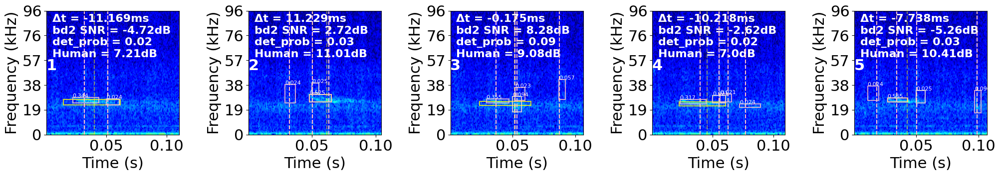

In [53]:
selections = suspect_lf_bd2_true_positives[:5].reset_index(drop=True).copy()
plt.figure(figsize=(4.1*int(np.ceil(len(selections))), 4))
plt.rcParams.update({'font.size': 22})
overlap_count = 0
for ind, selection_row in selections.iterrows():
    plt.subplot(1, int(np.ceil(len(selections))), ind+1)
    input_file = Path(selection_row['input_file'])
    file_name = input_file.name
    file_path = Path(RAVENTXT_HUMAN_ANNOTATIONS_SAVE_DIR) / file_name
    audio_file = sf.SoundFile(file_path)
    fs = audio_file.samplerate

    raventxt_human_filename = f'{input_file.stem}_manually_verified_by_AK_with_groups'

    start = selection_row['start_time']-0.05
    audio_file.seek(int(fs*(start)))
    duration = (selection_row['end_time']-selection_row['start_time'])+0.1
    audio_seg = audio_file.read(int(fs*duration))

    plt.specgram(audio_seg, NFFT=256, Fs=fs, cmap='jet', vmin=-120, vmax=0)

    ax = plt.gca()
    rect = patches.Rectangle(((selection_row['start_time'] - start), selection_row['low_freq']), 
                    (selection_row['end_time'] - selection_row['start_time']), (selection_row['high_freq'] - selection_row['low_freq']), 
                    linewidth=1.5, edgecolor=FREQ_COLORS[selection_row['freq_group']], facecolor='none', alpha=0.8)
    ax.add_patch(rect)
    ax.axvline(x=selection_row['peak_frequency_time_SPECTROGRAM']-start, linestyle='dashed', color='w')

    plot_humandets = lf_bd2_human_df_file[(lf_bd2_human_df_file['start_time']>=start)&(lf_bd2_human_df_file['end_time']<=(start+duration))]
    if len(plot_humandets)>0:
        closest_ind = np.abs((plot_humandets['peak_frequency_time'] - selection_row['peak_frequency_time_SPECTROGRAM'])).argmin()
        human_det = plot_humandets.iloc[closest_ind]
        rect = patches.Rectangle(((human_det['start_time'] - start), human_det['low_freq']), 
                        (human_det['end_time'] - human_det['start_time']), (human_det['high_freq'] - human_det['low_freq']), 
                        linewidth=1.5, edgecolor='yellow', facecolor='none', alpha=0.8, label=f'{human_det["adityas_method_snr_dB"]:.3}dB')
        ax.add_patch(rect)
        ax.axvline(x=human_det['peak_frequency_time']-start, linestyle='dashed', color='yellow', alpha=0.5)
        shortest_t_distance_in_window = (1000*(human_det['peak_frequency_time'] - selection_row['peak_frequency_time_SPECTROGRAM']))
        plt.text(x=0.005, y=60e3, s=f"Δt = {round(shortest_t_distance_in_window, 3)}ms\nbd2 SNR = {round(selection_row['SNR'], 2)}dB\ndet_prob = {round(selection_row['det_prob'], 2)}\nHuman = {round(human_det['adityas_method_snr_dB'], 2)}dB",
                fontsize=16, color='white', fontweight='bold', zorder=2)
        overlap_count+=1
        plt.text(x=0, y=50e3, s=f'{overlap_count}', color='w', fontweight='bold')

    LF_batdetect2_df = batdetect2_df[batdetect2_df['freq_group']=='LF'].copy()
    plot_allbd2rawdets = LF_batdetect2_df[(LF_batdetect2_df['start_time']>=start)&(LF_batdetect2_df['end_time']<=(start+duration))]
    for i, rawbd2_det in plot_allbd2rawdets.iterrows():
        rect = patches.Rectangle(((rawbd2_det['start_time'] - start), rawbd2_det['low_freq']), 
                        (rawbd2_det['end_time'] - rawbd2_det['start_time']), (rawbd2_det['high_freq'] - rawbd2_det['low_freq']), 
                        linewidth=1.5, edgecolor='pink', facecolor='none', alpha=0.8, label=f'{rawbd2_det["SNR"]:.3}dB')
        plt.text(x=(rawbd2_det['start_time'] - start), y=rawbd2_det['high_freq'], s=f'{rawbd2_det["det_prob"]}', color='w', fontsize=8)
        ax.axvline(x=rawbd2_det['peak_frequency_time_SPECTROGRAM']-start, linestyle='dashed', color='pink')
        ax.add_patch(rect)

    plt.yticks(ticks=np.linspace(0, fs/2, 6), labels=np.linspace(0, fs/2000, 6).astype('int'))
    plt.ylabel("Frequency (kHz)")
    plt.xlabel("Time (s)")

plt.tight_layout()
plt.show()

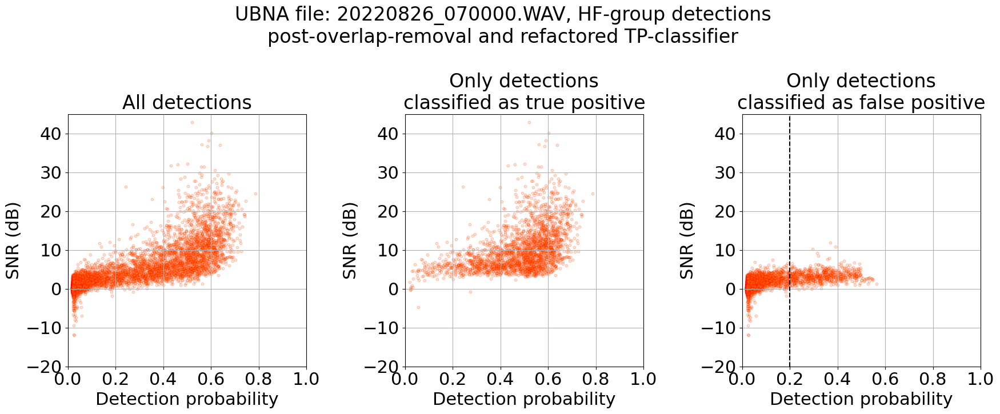

In [48]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18,7.5))
plt.rcParams.update({'font.size':20})

fig.suptitle(f'UBNA file: {wav_filename}.WAV, HF-group detections\npost-overlap-removal and refactored TP-classifier')

ax = ax1
ax.set_title(f'All detections')
ax.scatter(hf_bd2_file_all_dets['det_prob'].values, hf_bd2_file_all_dets['SNR'].values,
            alpha=0.2, s=10, facecolor='orange', edgecolor='red')
ax.grid(which='both')
ax.set_xlabel('Detection probability')
ax.set_ylabel('SNR (dB)')
ax.set_xlim(0, 1.0)
ax.set_ylim(-20, 45.0)

ax = ax2
ax.set_title(f'Only detections\nclassified as true positive')
ax.scatter(hf_bd2_true_positives['det_prob'].values, hf_bd2_true_positives['SNR'].values,
            alpha=0.2, s=10, facecolor='orange', edgecolor='red')
ax.grid(which='both')
ax.set_xlabel('Detection probability')
ax.set_ylabel('SNR (dB)')
ax.set_xlim(0, 1.0)
ax.set_ylim(-20, 45.0)

ax = ax3
ax.set_title(f'Only detections\nclassified as false positive')
ax.scatter(hf_bd2_false_positives['det_prob'].values, hf_bd2_false_positives['SNR'].values,
            alpha=0.2, s=10, facecolor='orange', edgecolor='red')
ax.axvline(x=0.2, linestyle='dashed', color='k')
ax.grid(which='both')
ax.set_xlabel('Detection probability')
ax.set_ylabel('SNR (dB)')
ax.set_xlim(0, 1.0)
ax.set_ylim(-20, 45.0)


fig.tight_layout()
plt.show()

In [49]:
suspect_hf_bd2_true_positives = hf_bd2_true_positives[(hf_bd2_true_positives['det_prob']<0.2)&(hf_bd2_true_positives['SNR']<3)]
suspect_hf_bd2_true_positives.head(2)

,freq_group,peak_frequency_time_SPECTROGRAM,peak_frequency_SPECTROGRAM,peak_frequency_WELCH,SNR,start_time,end_time,low_freq,high_freq,class,class_prob,det_prob,individual,event,sampling_rate,input_file
1919,HF,149.642767,48000.0,48000.0,2.820854,149.6395,149.6449,47812,57166,Pipistrellus pipistrellus,0.05,0.054,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
2381,HF,186.877467,79500.0,78720.0,0.868360,186.8745,186.9152,68437,82278,Rhinolophus ferrumequinum,0.03,0.030,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...


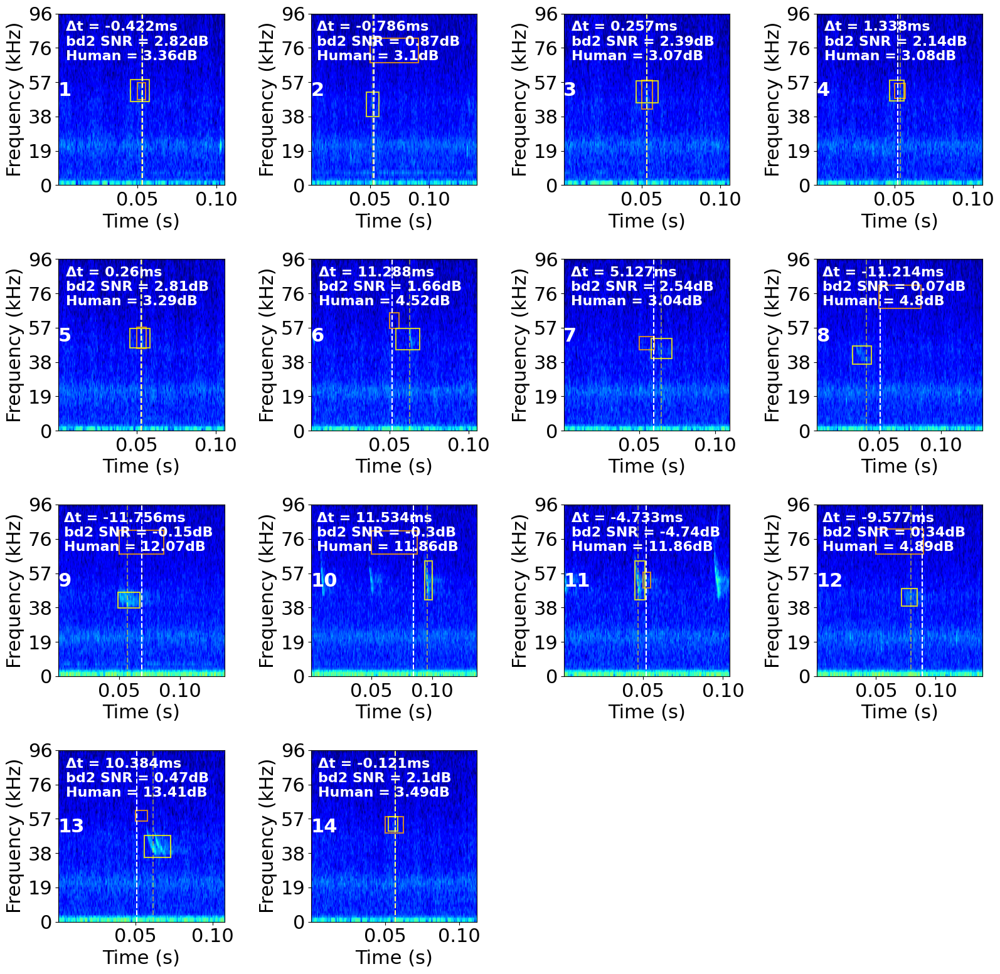

In [53]:
selections = suspect_hf_bd2_true_positives[:].reset_index(drop=True).copy()
plt.figure(figsize=(4.1*int(np.ceil(len(selections)**0.5)), 4*int(np.ceil(len(selections)**0.5))))
plt.rcParams.update({'font.size': 22})
overlap_count = 0
for ind, selection_row in selections.iterrows():
    plt.subplot(int(np.ceil(len(selections)**0.5)), int(np.ceil(len(selections)**0.5)), ind+1)
    input_file = Path(selection_row['input_file'])
    file_name = input_file.name
    file_path = Path(RAVENTXT_HUMAN_ANNOTATIONS_SAVE_DIR) / file_name
    audio_file = sf.SoundFile(file_path)
    fs = audio_file.samplerate

    raventxt_human_filename = f'{input_file.stem}_manually_verified_by_AK_with_groups'

    start = selection_row['start_time']-0.05
    audio_file.seek(int(fs*(start)))
    duration = (selection_row['end_time']-selection_row['start_time'])+0.1
    audio_seg = audio_file.read(int(fs*duration))

    plt.specgram(audio_seg, NFFT=156, Fs=fs, cmap='jet', vmin=-120, vmax=0)

    ax = plt.gca()
    rect = patches.Rectangle(((selection_row['start_time'] - start), selection_row['low_freq']), 
                    (selection_row['end_time'] - selection_row['start_time']), (selection_row['high_freq'] - selection_row['low_freq']), 
                    linewidth=1.5, edgecolor=FREQ_COLORS[selection_row['freq_group']], facecolor='none', alpha=0.8)
    ax.add_patch(rect)
    ax.axvline(x=selection_row['peak_frequency_time_SPECTROGRAM']-start, linestyle='dashed', color='w')

    plot_humandets = hf_bd2_human_df_file[(hf_bd2_human_df_file['start_time']>=start)&(hf_bd2_human_df_file['end_time']<=(start+duration))]
    if len(plot_humandets)>0:
        closest_ind = np.abs((plot_humandets['peak_frequency_time'] - selection_row['peak_frequency_time_SPECTROGRAM'])).argmin()
        human_det = plot_humandets.iloc[closest_ind]
        rect = patches.Rectangle(((human_det['start_time'] - start), human_det['low_freq']), 
                        (human_det['end_time'] - human_det['start_time']), (human_det['high_freq'] - human_det['low_freq']), 
                        linewidth=1.5, edgecolor='yellow', facecolor='none', alpha=0.8, label=f'{human_det["adityas_method_snr_dB"]:.3}dB')
        ax.add_patch(rect)
        ax.axvline(x=human_det['peak_frequency_time']-start, linestyle='dashed', color='yellow', alpha=0.5)
        shortest_t_distance_in_window = (1000*(human_det['peak_frequency_time'] - selection_row['peak_frequency_time_SPECTROGRAM']))
        plt.text(x=0.005, y=70e3, s=f"Δt = {round(shortest_t_distance_in_window, 3)}ms\nbd2 SNR = {round(selection_row['SNR'], 2)}dB\nHuman = {round(human_det['adityas_method_snr_dB'], 2)}dB",
                fontsize=16, color='white', fontweight='bold', zorder=2)
        overlap_count+=1
        plt.text(x=0, y=50e3, s=f'{overlap_count}', color='w', fontweight='bold')
    plt.yticks(ticks=np.linspace(0, fs/2, 6), labels=np.linspace(0, fs/2000, 6).astype('int'))
    plt.ylabel("Frequency (kHz)")
    plt.xlabel("Time (s)")

plt.tight_layout()
plt.show()